In [1]:
!git clone https://github.com/ultralytics/yolov5.git
!pip install -r yolov5/requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 16941, done.
remote: Counting objects: 100% (136/136), done.
remote: Compressing objects: 100% (88/88), done.
remote: Total 16941 (delta 70), reused 92 (delta 48), pack-reused 16805 (from 1)
Receiving objects: 100% (16941/16941), 15.70 MiB | 28.75 MiB/s, done.
Resolving deltas: 100% (11603/11603), done.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 45.8 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 872.1/872.1 kB 41.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 56.8 MB/s eta 0:00:00
  Attempting uninstall: setuptools
    Found existing installation: setuptools 69.0.3
    Uninstalling setuptools-69.0.3:
      Successfully uninstalled setuptools-69.0.3
  Attempting uninstall: pillow
    Found existing installation: Pillow 9.5.0
    Uninstalling Pillow-9.5.0:
      Successfully uninstalled Pillow-

In [28]:
import os
import shutil
import yaml
from pathlib import Path
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import torch
import random
import numpy as np
from yolov5.models.yolo import Model
from PIL import Image as PILImage
import sys
from IPython.display import Image, display, clear_output
from matplotlib.patches import Rectangle

In [3]:
train_images_path = '/kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/train'
val_images_path = '/kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/val'
test_images_path = '/kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/images/test'
train_labels_path = '/kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/labels/train'
val_labels_path = '/kaggle/input/traffic-vehicles-object-detection/Traffic Dataset/labels/val'

yolo_train_images_path = '/kaggle/working/yolo_data/images/train'
yolo_val_images_path = '/kaggle/working/yolo_data/images/val'
yolo_test_images_path = '/kaggle/working/yolo_data/images/test'
yolo_train_labels_path = '/kaggle/working/yolo_data/labels/train'
yolo_val_labels_path = '/kaggle/working/yolo_data/labels/val'

In [4]:
def ensure_dir(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)

ensure_dir(yolo_train_images_path)
ensure_dir(yolo_val_images_path)
ensure_dir(yolo_test_images_path) 
ensure_dir(yolo_train_labels_path)
ensure_dir(yolo_val_labels_path)


def copy_images_and_labels(image_names, src_img_dir, src_label_dir, dest_img_dir, dest_label_dir, copy_labels=True):
    for img_name in image_names:
        src_img = os.path.join(src_img_dir, img_name)
        dest_img = os.path.join(dest_img_dir, img_name)
        if os.path.isfile(src_img):
            shutil.copy(src_img, dest_img)
        else:
            print(f"Warning: Image {src_img} not found.")
        if copy_labels:
            label_name = os.path.splitext(img_name)[0] + '.txt'
            src_label = os.path.join(src_label_dir, label_name)
            dest_label = os.path.join(dest_label_dir, label_name)
            if os.path.isfile(src_label):
                shutil.copy(src_label, dest_label)
            else:
                print(f"Warning: Label {src_label} not found.")


In [5]:
train_images = os.listdir(train_images_path)
val_images = os.listdir(val_images_path)
test_images = os.listdir(test_images_path)

copy_images_and_labels(train_images, train_images_path, train_labels_path, yolo_train_images_path, yolo_train_labels_path)
copy_images_and_labels(val_images, val_images_path, val_labels_path, yolo_val_images_path, yolo_val_labels_path)
copy_images_and_labels(test_images, test_images_path, None, yolo_test_images_path, None, copy_labels=False)

In [6]:
yolo_data_path = '/kaggle/working/yolo_data'
data_yaml_path = os.path.join(yolo_data_path, 'data.yaml')

data = {
    'train': os.path.join(yolo_data_path, 'images/train'),
    'val': os.path.join(yolo_data_path, 'images/val'),
    'test': os.path.join(yolo_data_path, 'images/test'),
    'nc': 7, 
    'names': ['Car', 'Number Plate', 'Blur Number Plate', 'Two Wheeler', 'Auto', 'Bus', 'Truck']
}

with open(data_yaml_path, 'w') as f:
    yaml.dump(data, f)

print(f"Created data.yaml at {data_yaml_path}")

Created data.yaml at /kaggle/working/yolo_data/data.yaml


In [7]:
!ls /kaggle/working

yolo_data  yolov5


In [8]:
!export WANDB_MODE=disabled && cd yolov5 && python train.py --img-size 640 --batch-size 16 --epochs 100 --data {data_yaml_path} --cfg yolov5s.yaml --weights '' --name yolov5_traffic_detection --cache

wandb: WARNING ⚠️ wandb is deprecated and will be removed in a future release. See supported integrations at https://github.com/ultralytics/yolov5#integrations.
2024-09-03 19:21:53.444559: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-09-03 19:21:53.444689: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-09-03 19:21:53.573698: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
train: weights=, cfg=yolov5s.yaml, data=/kaggle/working/yolo_data/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, 

In [9]:
!cd yolov5 && python detect.py --weights /kaggle/working/yolov5/runs/train/yolov5_traffic_detection/weights/best.pt --img-size 640 --conf-thres 0.4 --source {os.path.join(yolo_data_path, 'images/test')} --save-txt --save-crop

detect: weights=['/kaggle/working/yolov5/runs/train/yolov5_traffic_detection/weights/best.pt'], source=/kaggle/working/yolo_data/images/test, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=True, save_format=0, save_csv=False, save_conf=False, save_crop=True, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-363-gf44db010 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7029004 parameters, 0 gradients, 15.8 GFLOPs
image 1/278 /kaggle/working/yolo_data/images/test/00 (1).png: 640x608 1 Car, 1 Number Plate, 50.0ms
image 2/278 /kaggle/working/yolo_data/images/test/00 (10).png: 640x640 1 Number Plate, 1 Two Wheeler, 11.7ms
image 3/278 /kaggle/working/yolo_data/images/test/

In [67]:
def display_predictions(image_path, label_dir, class_names):
    img = cv2.imread(image_path)
    if img is None:
        print(f"Error: Unable to open image file {image_path}.")
        return
    img_height, img_width = img.shape[:2]
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(img_rgb)
    
    label_file = os.path.join(label_dir, os.path.splitext(os.path.basename(image_path))[0] + '.txt')
    if os.path.isfile(label_file):
        with open(label_file, 'r') as file:
            for line in file:
                parts = line.strip().split()
                if len(parts) < 5:
                    print(f"Warning: Incorrect format in label file {label_file}.")
                    continue
                class_id, x_center, y_center, width, height = map(float, parts)
                x_center *= img_width
                y_center *= img_height
                width *= img_width
                height *= img_height
                x_min = x_center - width / 2
                y_min = y_center - height / 2
                
                rect = patches.Rectangle(
                    (x_min, y_min),
                    width,
                    height,
                    linewidth=1,
                    edgecolor='r',
                    facecolor='none'
                )
                ax.add_patch(rect)
                class_name = class_names[int(class_id)]
                probability = 1.0 
                ax.text(x_min, y_min, f'{class_name} ({probability:.2f})', color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))
    else:
        print(f"Warning: No label file found for {image_path}. Displaying image without labels.")
    
    ax.set_title(os.path.basename(image_path))
    ax.axis('off')
    plt.close(fig)
    display(fig)

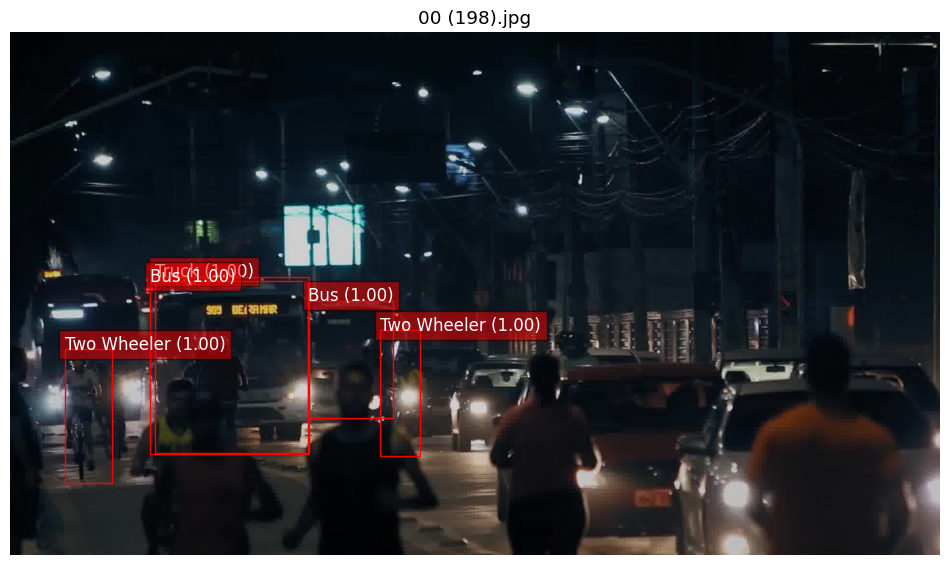

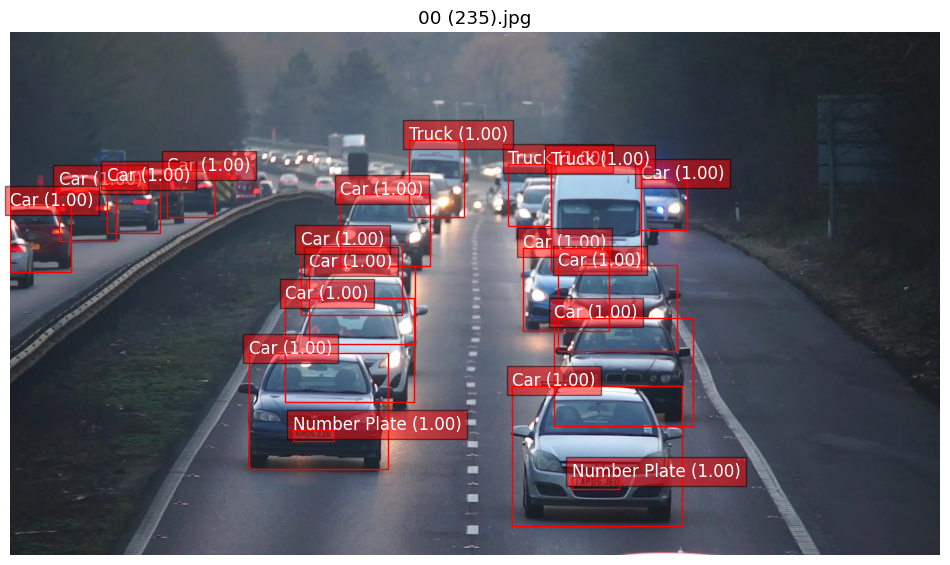

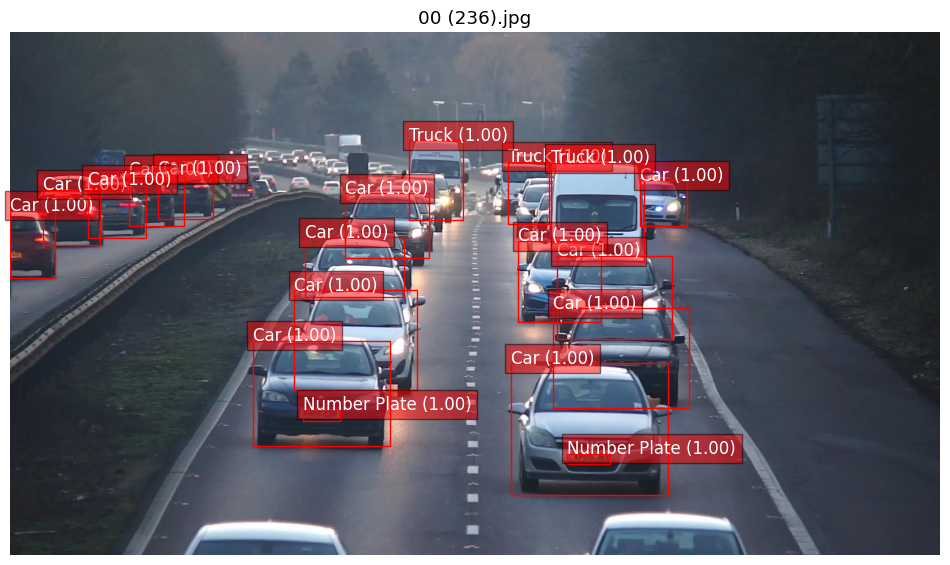

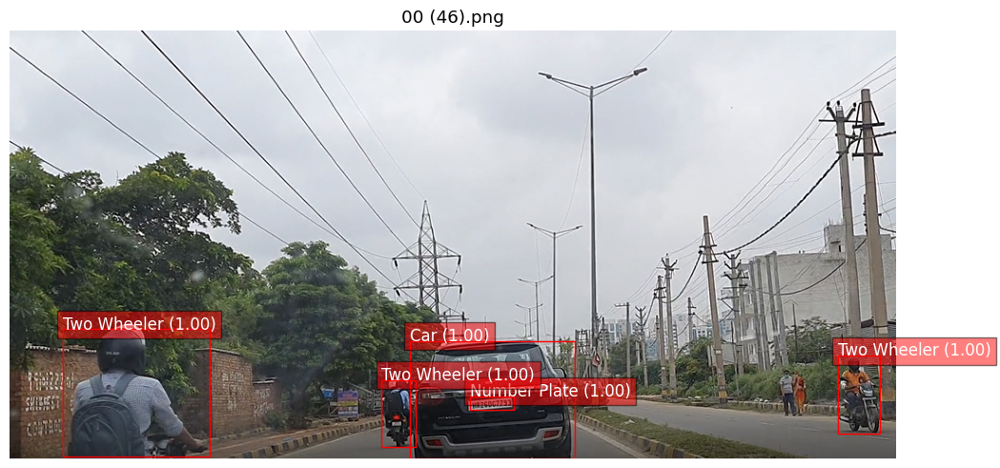

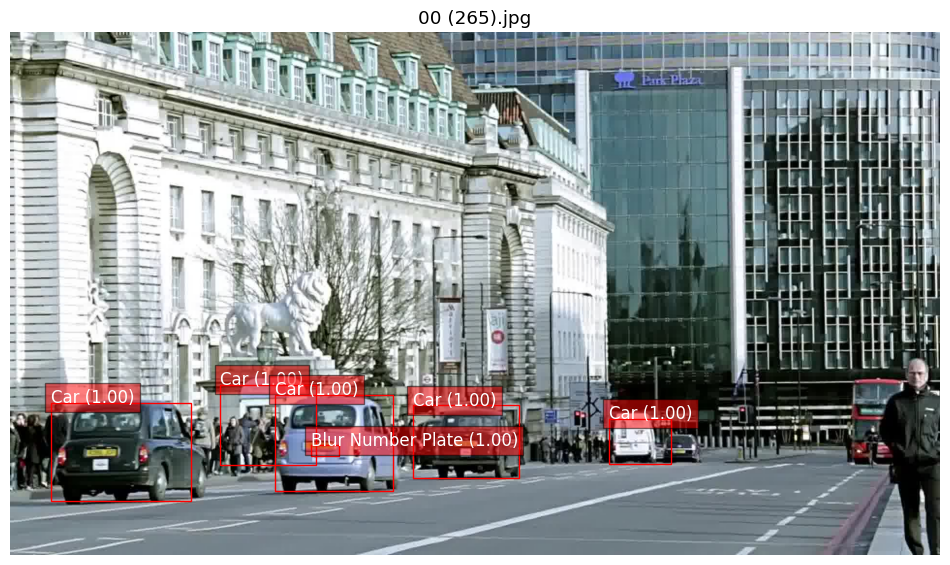

...

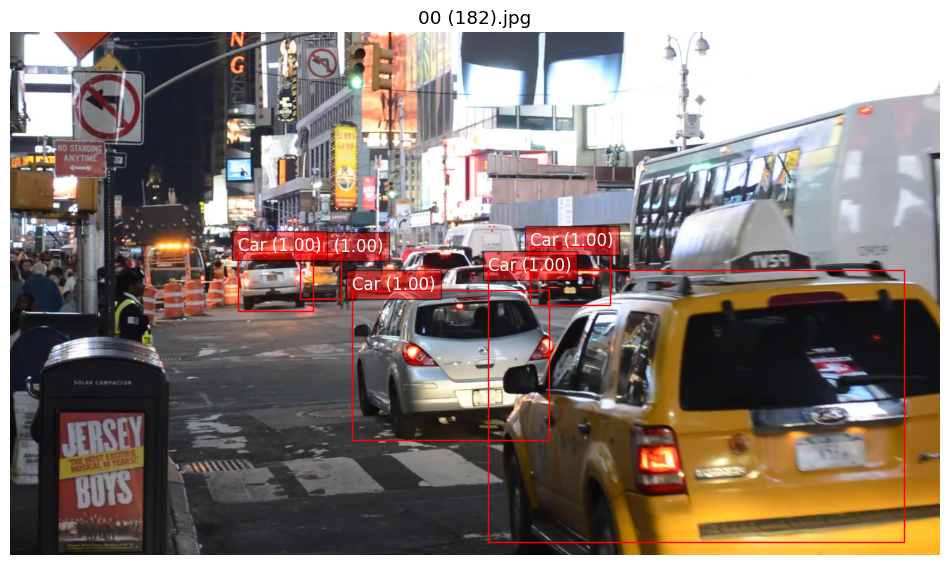

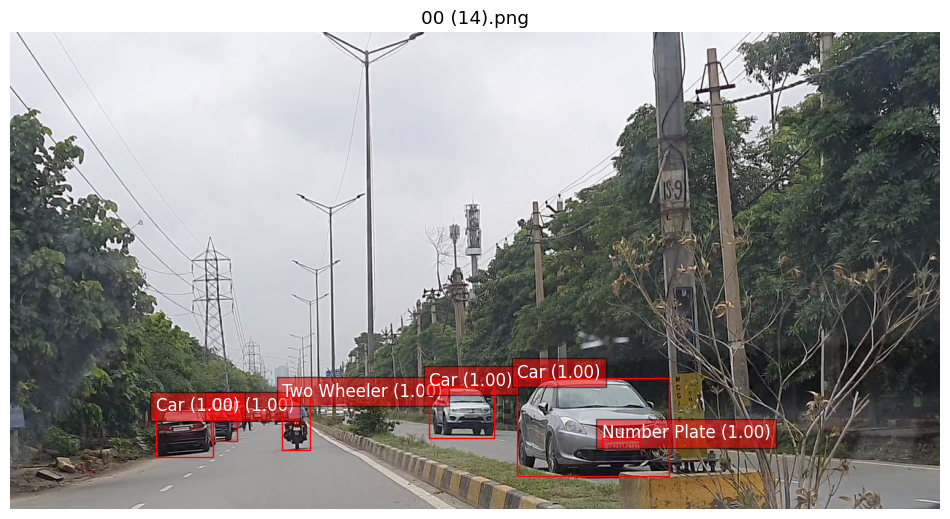

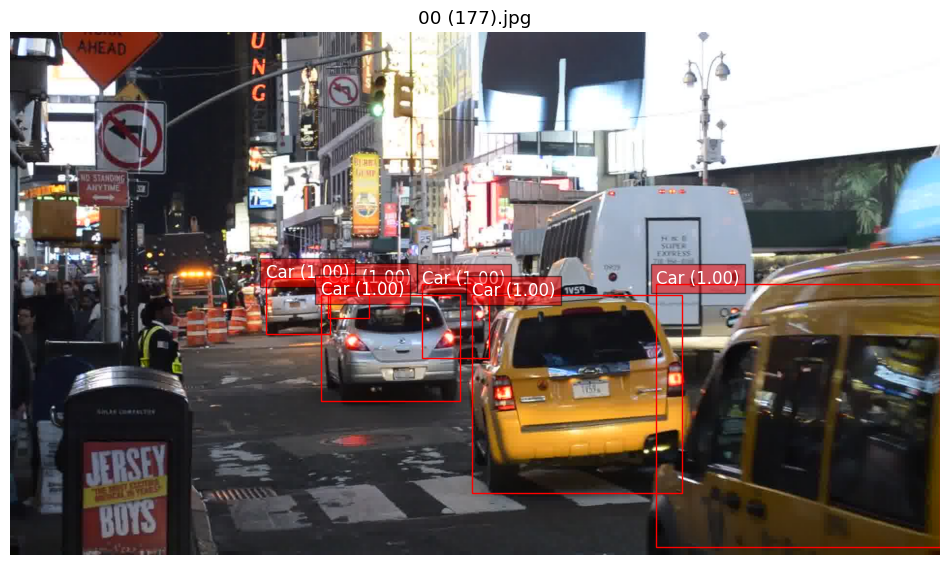

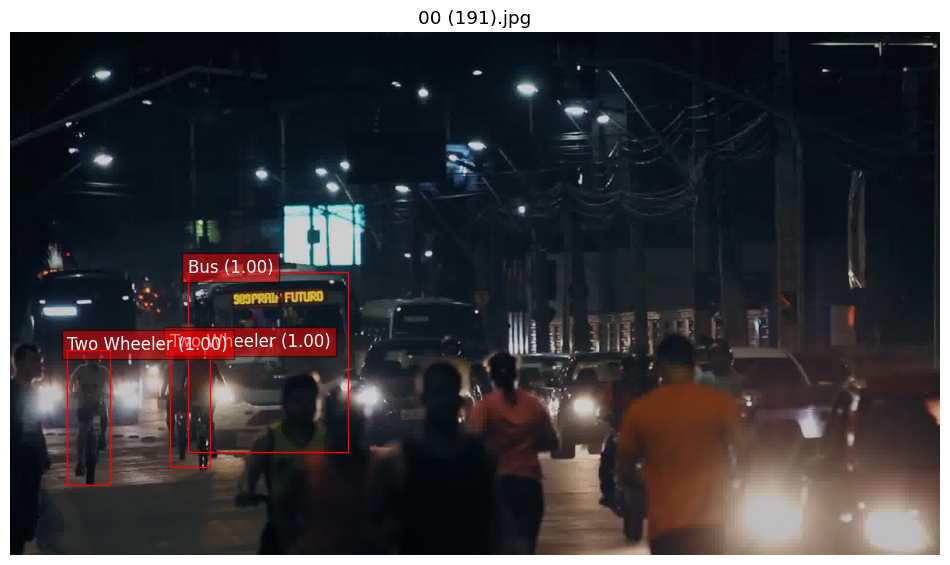

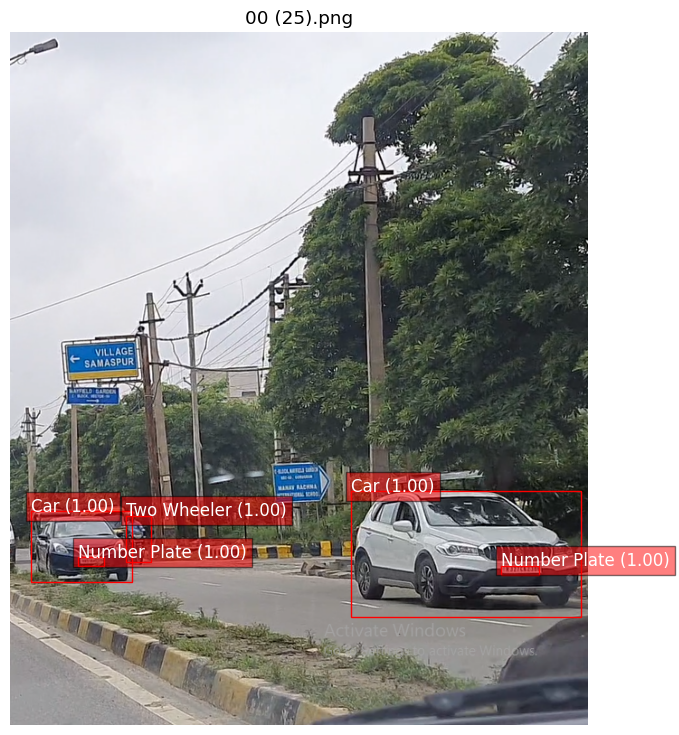

In [69]:
test_img_path = '/kaggle/working/yolo_data/images/test'
label_path = '/kaggle/working/yolov5/runs/detect/exp/labels'
class_names = ['Car', 'Number Plate', 'Blur Number Plate', 'Two Wheeler', 'Auto', 'Bus', 'Truck']
test_images = [f for f in os.listdir(test_img_path) if f.lower().endswith(('.jpg', '.png'))]
random_images = random.sample(test_images, min(15, len(test_images)))
for file_name in random_images:
    image_path = os.path.join(test_img_path, file_name)
    display_predictions(image_path, label_path, class_names)

In [97]:
def draw_boxes_on_frame(frame, boxes, class_names):
    img_height, img_width = frame.shape[:2]
    img_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(img_rgb)
    for box in boxes:
        if len(box) == 5: 
            class_id, x_center, y_center, width, height = box
            prob = 1.0 
        elif len(box) == 6:
            class_id, x_center, y_center, width, height, prob = box
        else:
            print("Warning: Invalid box format. Skipping box.")
            continue
        x_center *= img_width
        y_center *= img_height
        width *= img_width
        height *= img_height
        x_min = x_center - width / 2
        y_min = y_center - height / 2
        rect = patches.Rectangle(
            (x_min, y_min),
            width,
            height,
            linewidth=1,
            edgecolor='r',
            facecolor='none'
        )
        ax.add_patch(rect)
        class_name = class_names[int(class_id)]
        ax.text(x_min, y_min, f'{class_name} ({prob:.2f})', color='white', fontsize=12, bbox=dict(facecolor='red', alpha=0.5))
    ax.axis('off')
    plt.close(fig)
    display(fig)
    
def process_video(video_path, label_dir, class_names):
    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"Error: Unable to open video file {video_path}.")
        return

    while True:
        ret, frame = cap.read()
        if not ret:
            break
        frame_number = int(cap.get(cv2.CAP_PROP_POS_FRAMES)) - 1
        base_name = os.path.basename(video_path)
        video_name = os.path.splitext(base_name)[0]
        label_file = os.path.join(label_dir, f'{video_name}_{frame_number}.txt')
        if os.path.isfile(label_file):
            with open(label_file, 'r') as file:
                boxes = [list(map(float, line.strip().split())) for line in file]
        else:
            boxes = []
        draw_boxes_on_frame(frame, boxes, class_names)
        clear_output(wait=True) 
    cap.release()

def display_random_video(test_video_path, label_path, class_names):
    video_files = [f for f in os.listdir(test_video_path) if f.lower().endswith(('.mp4', '.avi', '.mov'))]
    random_video = random.choice(video_files)
    video_path = os.path.join(test_video_path, random_video)
    process_video(video_path, label_path, class_names)

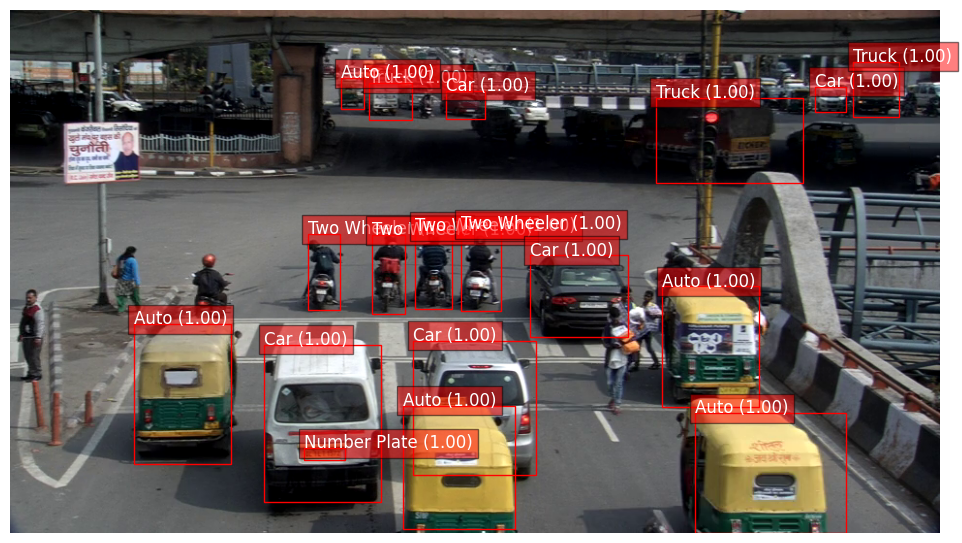

In [98]:
test_video_path = '/kaggle/working/yolo_data/images/test' 
label_path = '/kaggle/working/yolov5/runs/detect/exp/labels'
class_names = ['Car', 'Number Plate', 'Blur Number Plate', 'Two Wheeler', 'Auto', 'Bus', 'Truck']

display_random_video(test_video_path, label_path, class_names)

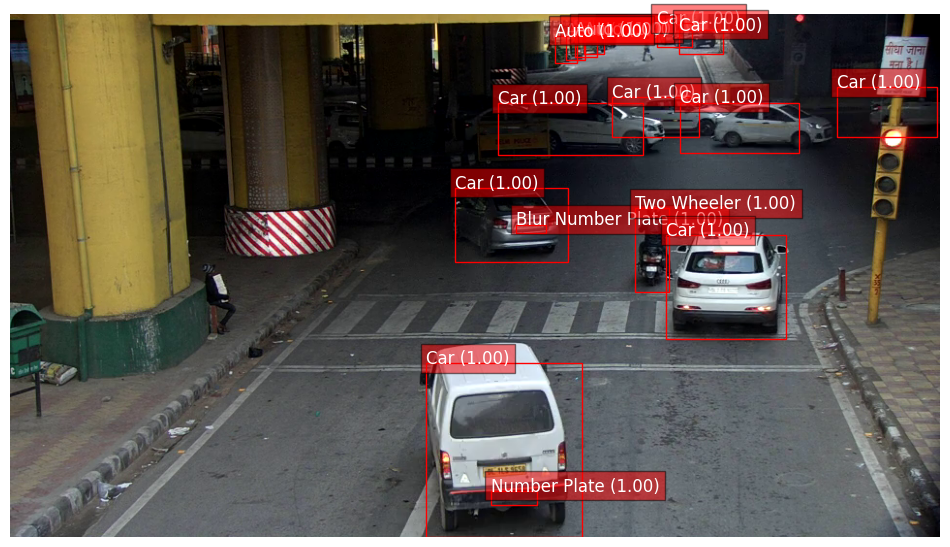

In [99]:
test_video_path = '/kaggle/working/yolo_data/images/test' 
label_path = '/kaggle/working/yolov5/runs/detect/exp/labels'
class_names = ['Car', 'Number Plate', 'Blur Number Plate', 'Two Wheeler', 'Auto', 'Bus', 'Truck']

display_random_video(test_video_path, label_path, class_names)

In [100]:
!python yolov5/export.py --weights /kaggle/working/yolov5/runs/train/yolov5_traffic_detection/weights/best.pt --img-size 640 --batch-size 1 --device cpu --include onnx

export: data=yolov5/data/coco128.yaml, weights=['/kaggle/working/yolov5/runs/train/yolov5_traffic_detection/weights/best.pt'], imgsz=[640], batch_size=1, device=cpu, half=False, inplace=False, keras=False, optimize=False, int8=False, per_tensor=False, dynamic=False, simplify=False, mlmodel=False, opset=17, verbose=False, workspace=4, nms=False, agnostic_nms=False, topk_per_class=100, topk_all=100, iou_thres=0.45, conf_thres=0.25, include=['onnx']
YOLOv5 🚀 v7.0-363-gf44db010 Python-3.10.13 torch-2.1.2 CPU

Fusing layers... 
YOLOv5s summary: 157 layers, 7029004 parameters, 0 gradients, 15.8 GFLOPs

PyTorch: starting from /kaggle/working/yolov5/runs/train/yolov5_traffic_detection/weights/best.pt with output shape (1, 25200, 12) (13.7 MB)

ONNX: starting export with onnx 1.16.1...
ONNX: export success ✅ 1.0s, saved as /kaggle/working/yolov5/runs/train/yolov5_traffic_detection/weights/best.onnx (27.2 MB)

Export complete (1.6s)
Results saved to /kaggle/working/yolov5/runs/train/yolov5_traff

In [101]:
model_path = '/kaggle/working/yolov5/runs/train/yolov5_traffic_detection/weights/best.pt'
model = torch.hub.load('/kaggle/working/yolov5', 'custom', path=model_path, source='local')
model.eval()

YOLOv5 🚀 v7.0-363-gf44db010 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
YOLOv5s summary: 157 layers, 7029004 parameters, 0 gradients, 15.8 GFLOPs
Adding AutoShape... 


AutoShape(
  (model): DetectMultiBackend(
    (model): DetectionModel(
      (model): Sequential(
        (0): Conv(
          (conv): Conv2d(3, 32, kernel_size=(6, 6), stride=(2, 2), padding=(2, 2))
          (act): SiLU(inplace=True)
        )
        (1): Conv(
          (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (act): SiLU(inplace=True)
        )
        (2): C3(
          (cv1): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv2): Conv(
            (conv): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (cv3): Conv(
            (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1))
            (act): SiLU(inplace=True)
          )
          (m): Sequential(
            (0): Bottleneck(
              (cv1): Conv(
                (conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  

In [102]:
test_images_dir = '/kaggle/input/testing-traffic'

def predict_images(model, image_dir):
    image_paths = list(Path(image_dir).glob('*.*'))
    results = []
    for image_path in image_paths:
        img = cv2.imread(str(image_path))
        if img is None:
            print(f"Skipping file (not an image or corrupted): {image_path}")
            continue
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        results.append((image_path, model(img_rgb)))
    return results

results = predict_images(model, test_images_dir)

for img_path, result in results:
    pred_df = result.pandas().xyxy[0] 
    print(f"Processing: {img_path.name}")
    print(f"Predictions for {img_path.name}:")
    print(pred_df)
    print("\n")

Processing: img3.jpg
Predictions for img3.jpg:
         xmin        ymin        xmax        ymax  confidence  class  \
0  212.496246  218.364319  255.571732  311.552612    0.709709      3   
1  249.341812  211.941940  304.631744  343.116364    0.678134      3   
2  134.779633  199.021149  185.155945  298.065094    0.630226      3   
3  363.623749  222.795624  487.434937  408.453156    0.573869      3   
4   69.064674  178.351669  104.976532  221.453339    0.537057      5   
5  160.992554  215.105988  211.321747  327.316559    0.497148      3   
6  472.670654  197.788284  566.573608  374.631897    0.467335      3   
7  395.643402  148.508881  576.250793  299.001526    0.365795      5   
8    7.170394  207.422821  143.424545  409.000000    0.347128      3   

          name  
0  Two Wheeler  
1  Two Wheeler  
2  Two Wheeler  
3  Two Wheeler  
4          Bus  
5  Two Wheeler  
6  Two Wheeler  
7          Bus  
8  Two Wheeler  


Processing: img 2.jpg
Predictions for img 2.jpg:
           

In [103]:
def draw_boxes_for_outside_samples(img, pred, image_name, max_size=(1024, 768)):
    height, width = img.shape[:2]
    scale = min(max_size[0] / width, max_size[1] / height)
    new_width = int(width * scale)
    new_height = int(height * scale)
    resized_img = cv2.resize(img, (new_width, new_height))
    img_rgb = cv2.cvtColor(resized_img, cv2.COLOR_BGR2RGB)
    fig, ax = plt.subplots(1, figsize=(12, 9))
    ax.imshow(img_rgb)
    pred_df = pred.pandas().xyxy[0]
    if not pred_df.empty:
        for _, row in pred_df.iterrows():
            x_min = int(row["xmin"] * scale)
            y_min = int(row["ymin"] * scale)
            x_max = int(row["xmax"] * scale)
            y_max = int(row["ymax"] * scale)
            class_name = row["name"]
            confidence = row["confidence"]
            rect = patches.Rectangle(
                (x_min, y_min),
                x_max - x_min,
                y_max - y_min,
                linewidth=2,
                edgecolor='r',
                facecolor='none'
            )
            ax.add_patch(rect)
            label = f'{class_name} {confidence:.2f}'
            plt.text(x_min, y_min - 10, label, color='r', fontsize=10, weight='bold')
    ax.set_title(f'Predictions for {image_name}')
    ax.axis('off')
    plt.close(fig) 
    display(fig)

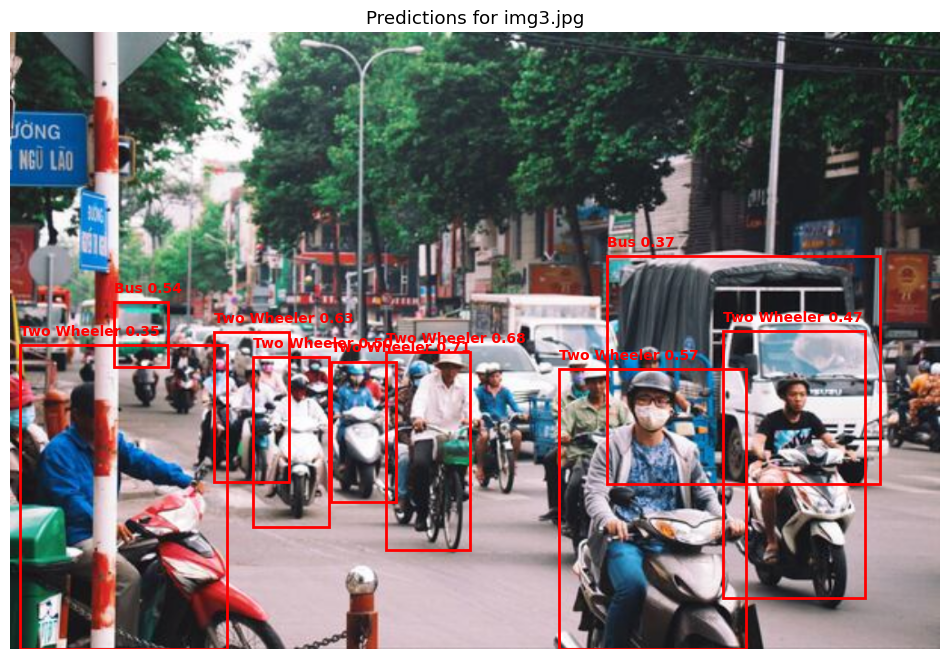

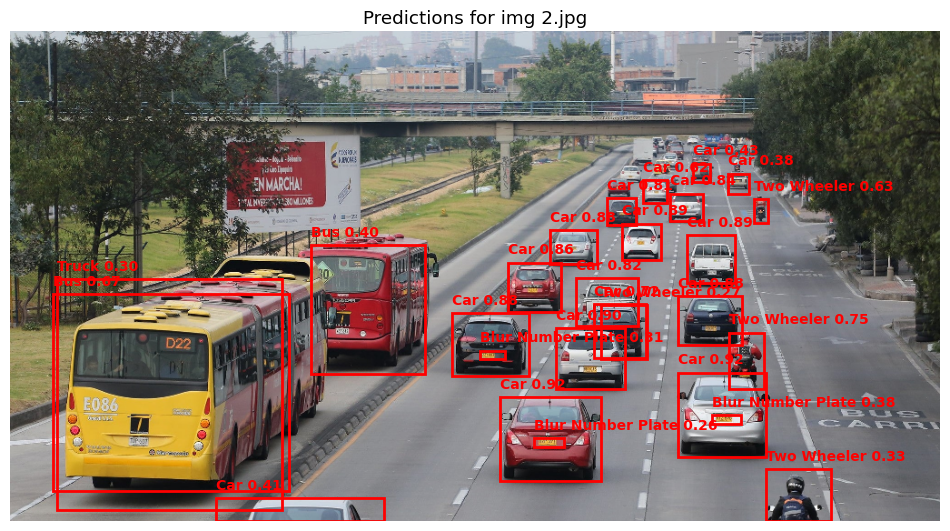

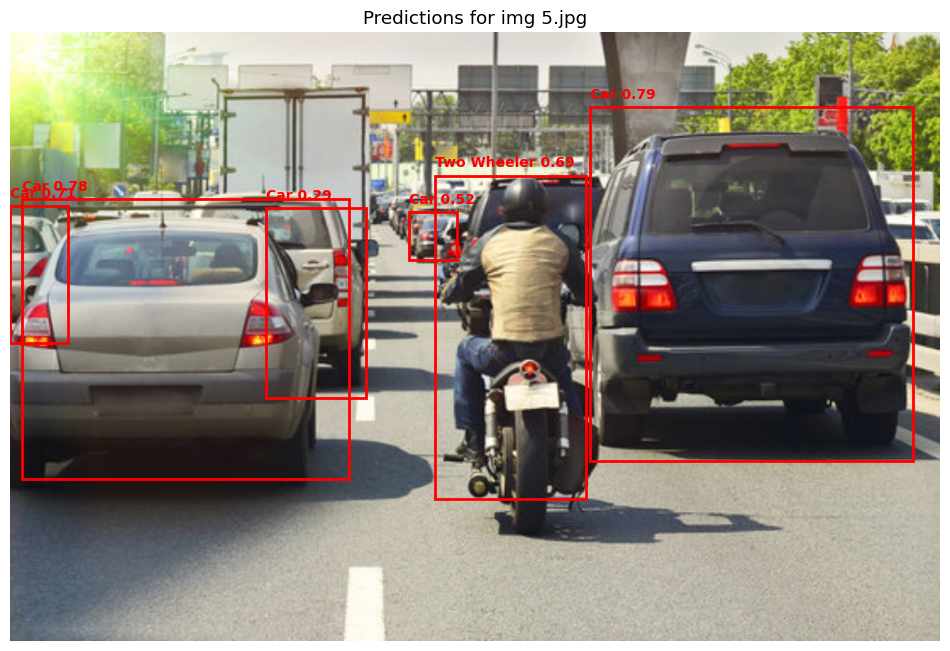

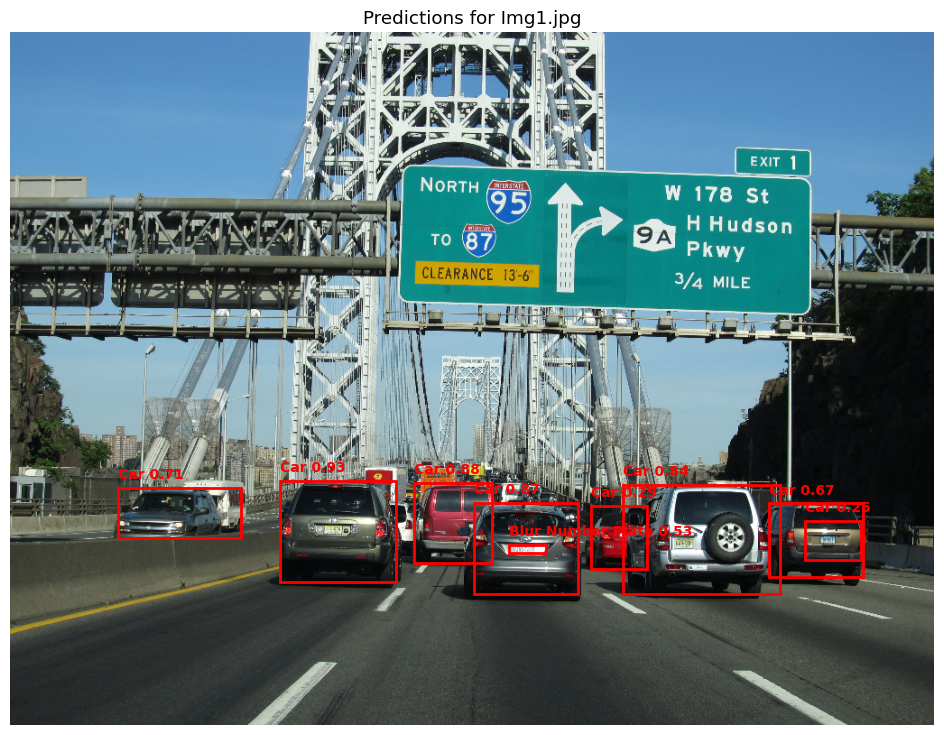

In [105]:
for img_path, result in results:
    img = cv2.imread(str(img_path))
    if img is not None:
        image_name = img_path.name
        draw_boxes_for_outside_samples(img, result, image_name)